### To Do: to implement the details about the echarts

In [1]:
# https://cloud.tencent.com/developer/article/1388001
# https://cloud.tencent.com/developer/article/1794911


In [2]:
%load_ext autoreload
%autoreload 2

import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

import talib as ta
from pyecharts.charts import Line, Kline,Pie, \
                      Grid,Timeline, \
                      WordCloud
from pyecharts import options as opts
import pandas as pd
import numpy as np

%matplotlib inline

import matplotlib.pyplot as plt
from zigzag import *

In [3]:
# from Yahoo Finance to get the data

# from VisualizationUtils.yahoo_finance_utils import get_yahoo_fx_df
# start_date = '2021-01-01'
# end_date = '2021-07-09'

# # currencies = ["EURUSD=X", "JPY=X", "CNY=X", "GBPUSD=X"]
# currencies = ["EURUSD=X"]
# curr = 'EURUSD'
# data = get_yahoo_fx_df(start_date, end_date, curr)

# data_list = data[["open", "close", "low", "high"]].values.tolist()
# data

In [4]:
df_rc = pd.read_csv("../data/yht_rc.csv")
df_rc.head()

,Symbol,Type,FollowmeLots,BrokerLots,OpenTime,CloseTime,OpenPrice,ClosePrice,Swaps,Commission,Profit,Pips,SL,TP,HoldingTime(s)
0,XAUUSD,buy,0.01,0.01,2021/8/25 10:09,2021/8/25 10:41,1793.61,1793.72,0.0,-0.07,0.11,1.1,1782.3,1796.00,1920
1,XAUUSD,buy,0.01,0.01,2021/8/25 10:31,2021/8/25 10:36,1792.29,1793.55,0.0,-0.07,1.26,12.6,0.0,0.00,340
2,XAUUSD,buy,0.01,0.01,2021/8/25 9:57,2021/8/25 10:03,1793.95,1794.77,0.0,-0.07,0.82,8.2,0.0,1795.85,370
3,XAUUSD,buy,0.01,0.01,2021/8/25 4:48,2021/8/25 8:05,1796.34,1795.16,0.0,-0.07,-1.18,-11.8,0.0,1797.50,11825
4,XAUUSD,buy,0.01,0.01,2021/8/25 6:04,2021/8/25 8:00,1794.97,1794.35,0.0,-0.07,-0.62,-6.2,0.0,1796.20,6980


In [5]:
from Utils.data_get_utils import get_duka_data_df
data_df = get_duka_data_df("../data/EURUSD5_duka_2021.csv", "EURUSD")

In [6]:
# data_ana_df = data_df[(data_df["datetime"]>="2021-01-05 22:00:00") & (data_df["datetime"]<="2021-01-05 23:59:59")]
data_ana_df = data_df
data_ana_df.head(5)

,symbol,datetime,open,high,low,close,volume
840,EURUSD,2021-01-03 22:00:00,1.22396,1.22420,1.22296,1.22347,115.280
841,EURUSD,2021-01-03 22:05:00,1.22347,1.22347,1.22298,1.22322,37.555
842,EURUSD,2021-01-03 22:10:00,1.22310,1.22319,1.22309,1.22315,3.020
843,EURUSD,2021-01-03 22:15:00,1.22324,1.22365,1.22324,1.22356,139.642
844,EURUSD,2021-01-03 22:20:00,1.22356,1.22356,1.22341,1.22341,126.250


In [7]:
datetime_list = data_ana_df['datetime'].tolist()
data_list = data_ana_df[["open", "close", "low", "high"]].values.tolist()

In [8]:
c = (
    Kline()
    .add_xaxis(datetime_list)
    .add_yaxis("kline", data_list)
    .set_global_opts(
        xaxis_opts=opts.AxisOpts(is_scale=True),
        yaxis_opts=opts.AxisOpts(
            is_scale=True,
            splitarea_opts=opts.SplitAreaOpts(
                is_show=True, areastyle_opts=opts.AreaStyleOpts(opacity=1)
            ),
        ),
        title_opts=opts.TitleOpts(title="K Line Graph"),
    )
)

In [9]:
c.render_notebook()

In [10]:
pivots = peak_valley_pivots(np.array(data_ana_df["close"]), 0.0025, -0.0025)

In [11]:
def plot_pivots(X, pivots):
    plt.xlim(0, len(X))
    plt.ylim(X.min()*0.99, X.max()*1.01)
    plt.plot(np.arange(len(X)), X, 'k:', alpha=0.5)
    plt.plot(np.arange(len(X))[pivots != 0], X[pivots != 0], 'k-')
    plt.scatter(np.arange(len(X))[pivots == 1], X[pivots == 1], color='g')
    plt.scatter(np.arange(len(X))[pivots == -1], X[pivots == -1], color='r')

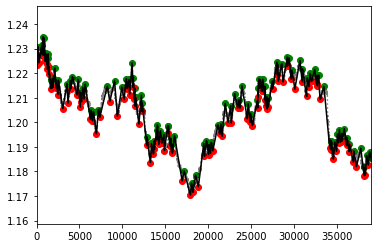

In [12]:
plot_pivots(np.array(data_ana_df["close"]), pivots)

In [13]:
pivots

array([ 1,  0, -1, ...,  0,  0,  1], dtype=int8)

In [14]:
data_ana_df.count()

symbol      39058
datetime    39058
open        39058
high        39058
low         39058
close       39058
volume      39058
dtype: int64